In [283]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt
from math import sqrt,exp

In [285]:
#Start coding, fill in the alignment with the NN later
#Load the image in, use ORB to find matches and find Perspective Transform/Warp image to see the result.
#Write subtraction code for each category. Figure out bounding box code later.

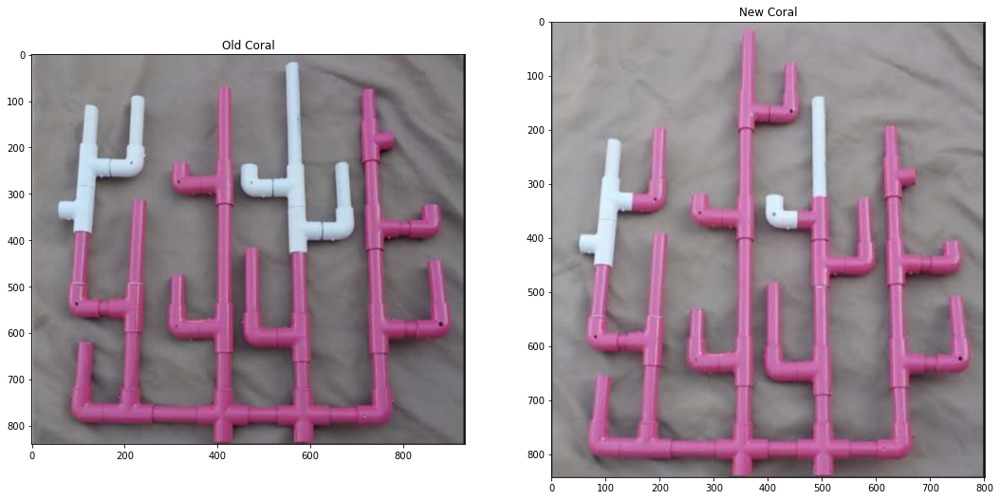

Old Shape (840, 933, 3)
New Shape (842, 801, 3)


In [287]:
imgOld = cv.imread('old_coral.PNG')
imgNew = cv.imread('new_coral.PNG')
imgOld = cv2.cvtColor(imgOld, cv2.COLOR_BGR2RGB)
imgNew = cv2.cvtColor(imgNew, cv2.COLOR_BGR2RGB)

fig, ax = plt.subplots(1, 2, figsize=(18, 50))
ax[0].imshow(imgOld)
ax[0].set_title("Old Coral")

ax[1].imshow(imgNew)
ax[1].set_title("New Coral")

plt.show()
print("Old Shape", imgOld.shape)
print("New Shape", imgNew.shape)

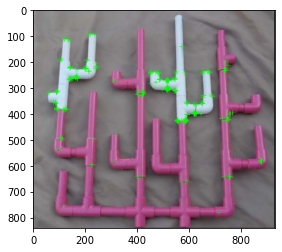

(<matplotlib.image.AxesImage at 0x1cc541c8648>, None)

In [289]:
# Initiate ORB detector
orb = cv.ORB_create()

# find the keypoints with ORB
kp, des = orb.detectAndCompute(imgOld,None)

# compute the descriptors with ORB
# kp, des = orb.compute(imgOld, kp)

# draw only keypoints location,not size and orientation
# img2 = cv2.drawKeypoints(imgOld, kp, None, color=(0,255,0), flags=0)
# plt.imshow(imgOld), plt.show()

imgOld2 = imgOld.copy()
for marker in kp:
	imgOld2 = cv.drawMarker(imgOld2, tuple(int(i) for i in marker.pt), color=(0, 255, 0))
plt.imshow(imgOld2, cmap = 'gray'), plt.show()

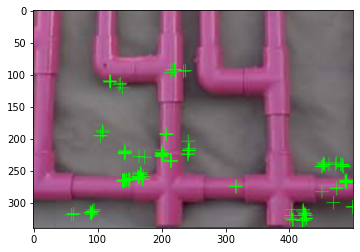

(<matplotlib.image.AxesImage at 0x1cc541aa7c8>, None)

In [292]:
#Trying out different feature detectors and cropping image.

imgCropped = imgOld[500:840, 200:700]
testOrb = cv.ORB_create()

# find the keypoints with ORB
kp2, des2 = orb.detectAndCompute(imgOld,None)

imgCropped2 = imgCropped.copy()
for marker in kp:
	imgCropped2 = cv.drawMarker(imgCropped2, tuple(int(i) for i in marker.pt), color=(0, 255, 0))
plt.imshow(imgCropped2), plt.show()

In [293]:
def distance(point1,point2):
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def gaussianLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

Text(0.5, 1.0, 'Back to Original')

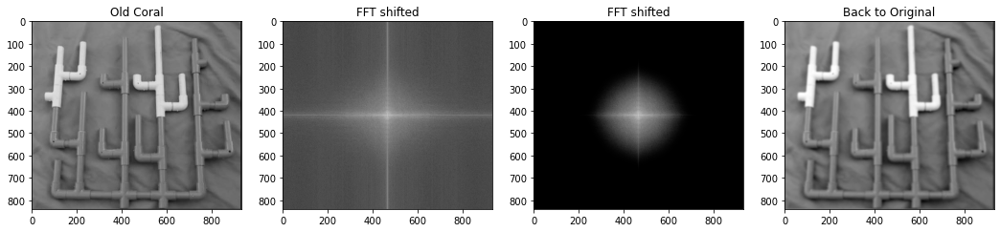

In [294]:
#Great, we can perform local feature detection at the root.
#This way, less things to mismatch. 

#Lets low pass filer and binarize the image for more denoising:
img_c1 = cv2.imread("old_coral.PNG", 0)
img_c2 = np.fft.fft2(img_c1)
img_c3 = np.fft.fftshift(img_c2)
img_c4 = np.fft.ifftshift(img_c3)
img_c5 = np.fft.ifft2(img_c4)

fig, ax = plt.subplots(1, 4, figsize=(18, 40))
ax[0].imshow(abs(img_c1), cmap = 'gray')   
ax[0].set_title("Old Coral")

ax[1].imshow(np.log(1+abs(img_c3)), cmap = 'gray')   #To plot the magnitude of FFT, use absolute value. Becuase abs ends up very small, use log to increase the contrast between small magnitudes. 
ax[1].set_title("FFT shifted")

filtered = img_c3 * gaussianLP(50, img_c3.shape)
ax[2].imshow(np.log(1 + abs(filtered)), cmap = 'gray')
ax[2].set_title("FFT shifted")

filtered_ishifted = np.fft.ifftshift(filtered)
filtered_spatial = np.fft.ifft2(filtered_ishifted)

ax[3].imshow(abs(filtered_spatial), cmap = 'gray')
ax[3].set_title("Back to Original")


Text(0.5, 1.0, 'Low Pass')

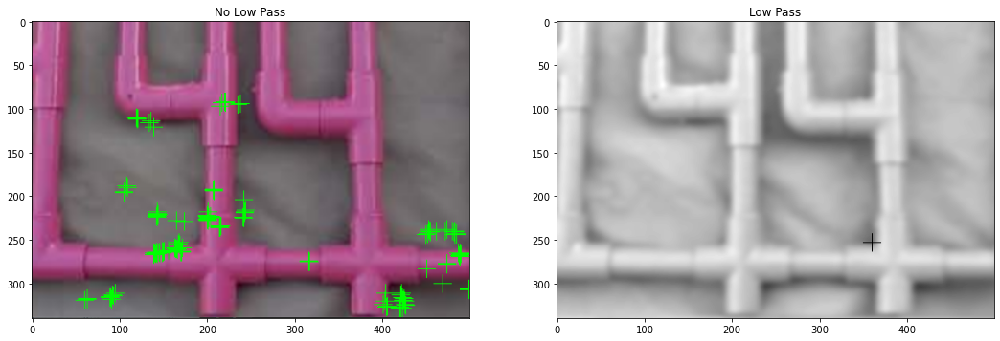

In [291]:
#ORB to low pass:
orb_lp = cv2.ORB_create()

filtered_spatial = filtered_spatial.astype(np.uint8)
fs_cropped = filtered_spatial[500:840, 200:700]
kp_lp, des_lp = orb.detectAndCompute(fs_cropped, None)

fs_cropped2 = fs_cropped.copy()
for marker in kp_lp:
	fs_cropped2 = cv.drawMarker(fs_cropped2, tuple(int(i) for i in marker.pt), color=(0, 255, 0))
# plt.imshow(fs_cropped2, cmap = 'gray'), plt.show()

fig, ax = plt.subplots(1, 2, figsize=(18, 40))
ax[0].imshow(imgCropped2, cmap = 'gray')   
ax[0].set_title("No Low Pass")

ax[1].imshow(fs_cropped2, cmap = 'gray')   
ax[1].set_title("Low Pass")

#Low pass does not change features, may still want to do. 

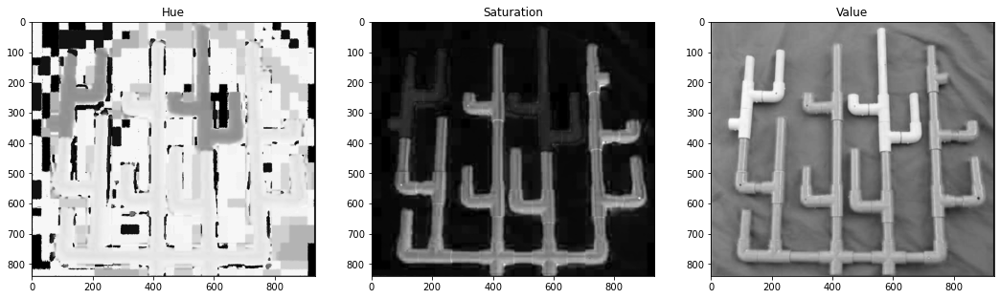

In [163]:
#lets try binarizing first:

#first, convert to HSV and get a color bar:
HSV_img = cv2.cvtColor(imgOld, cv.COLOR_RGB2HSV)
# print(HSV_img.shape)

fig, ax = plt.subplots(1, 3, figsize=(18, 30))
ax[0].imshow(HSV_img[:,:,0], cmap='gray')
ax[0].set_title("Hue")

ax[1].imshow(HSV_img[:,:,1], cmap='gray') #Saturation yields a very good segmentation
ax[1].set_title("Saturation")

ax[2].imshow(HSV_img[:,:,2], cmap='gray')
ax[2].set_title("Value")

plt.show()

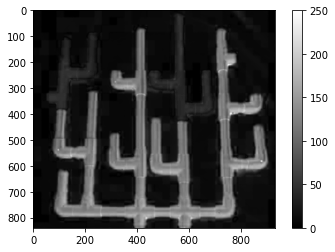

In [176]:
#Better Contrast for smoothed image? 
# --Nope lol, blurring isn't necessary for this image, but good to apply in the case there is underwater noise.
blurred = cv2.GaussianBlur(imgOld, (5,5), 0)
HSV_blur = cv2.cvtColor(blurred, cv.COLOR_RGB2HSV)

plt.imshow(HSV_blur[:,:,1], cmap = 'gray')
plt.colorbar()

[[ 98]
 [130]
 [194]]


(<Figure size 1008x1008 with 1 Axes>, <AxesSubplot:>)

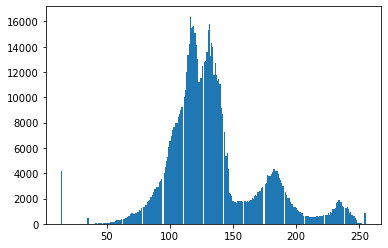

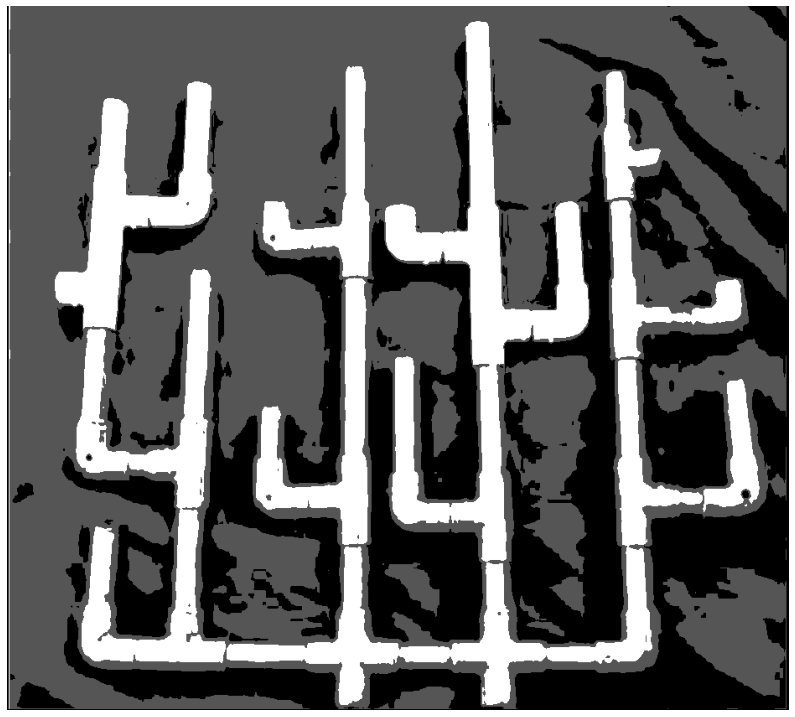

In [197]:
#Now, segment into three categories:
#Can do manually, but for competition, will need to generate segmenetation automatically in different lighting setting.
_ = plt.hist(HSV_img[:,:,2].flatten(), bins=256)

#Histogram has "three peaks", suitable for segmentation.
#K-Means, for grouping three colors:
Z = HSV_img[:,:,2].flatten()
Z = np.float32(Z)
criteria = (cv.TERM_CRITERIA_EPS + cv.TermCriteria_MAX_ITER, 10, 1.0)
K = 3   #Quantize to three colors
ret, label, center = cv.kmeans(Z, K, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)

center = np.uint8(center)
print(center)
res = center[label.flatten()]
res2 = res.reshape((HSV_img[:,:,2].shape))

image_show(res2)

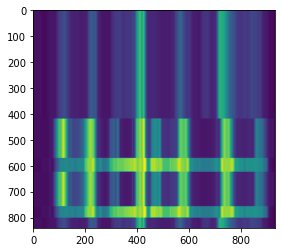

In [169]:
import sklearn

#opencv's implemntation works!!!!!
saturation = HSV_img[:,:,1]
original_shape = saturation.shape # so we can reshape the labels later

kmeans_cluster = sklearn.cluster.KMeans(n_clusters=3)
kmeans_cluster.fit(saturation)
cluster_centers = kmeans_cluster.cluster_centers_
cluster_labels = kmeans_cluster.labels_

plt.imshow(cluster_centers[cluster_labels].reshape(original_shape))
#kmeans does a really terrible job

OpenCV only offers binary segmenetation (library is not well documentated either)
After lots of patient searching, learned about python's image processing library, skikit-image. Good stuff.

Scikit-image basics:
-Import image from external source:
    from skimage import io 
    image = io.imread('image.png')
    plt.imshow(image) //Matplotlib

-Multiple Images: 
    images = io.ImageCollection ('path to image folder/*.jpg')

-Saving Images:
    io.imsave('logo.png', logo) //Saving image stored inside logo as logo.png

Onto Image segmenetation:
    Process of partitioning a digital image into multiple segments to simplify and/or change the representation of 
    an image into something that is more meaningful and easier to analyze.

    Two approaches:
        -Supervised Approach: Uses prior knowledge, possibly from human input, to guide algorithm.
            -Thresholding with Human Input 
            -Random Walker method
            -Active Contour method
        -Unsupervised Approach: No prior knowledge required.
            -Thresholding requiring no user input 
            -Slic method 
            -Felzenszwaib method 

    Starting with Thresholding:
        Define an intensity value, everything above is a category, everything below is a category.
        Helpful for binary segmenetation.
        
    


In [128]:
#Basic Imports:
import skimage.data as data
import skimage.segmentation as seg
import skimage.filters as filters
import skimage.draw as draw
import skimage.color as color

#Resuable Plotting Function:
def image_show(image, nrows=1, ncols=1, cmap='gray'):
    fig, ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=(14, 14))
    ax.imshow(image, cmap='gray')
    ax.axis('off')
    return fig, ax


(<Figure size 1008x1008 with 1 Axes>, <AxesSubplot:>)

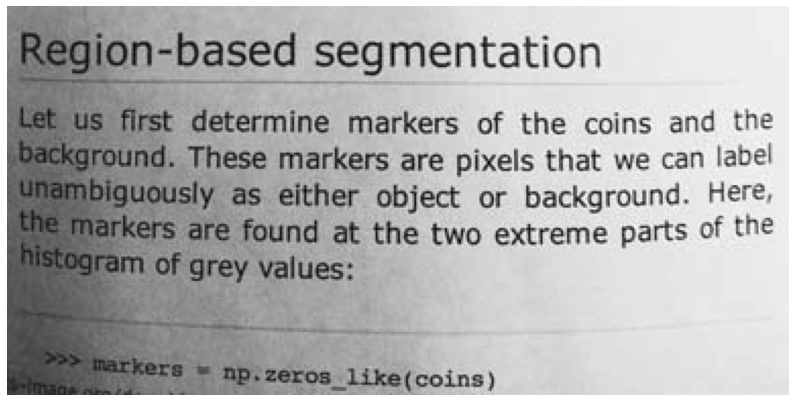

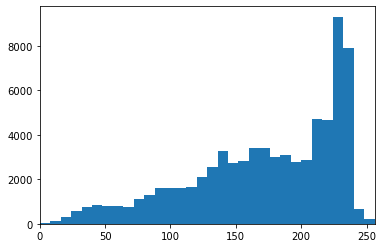

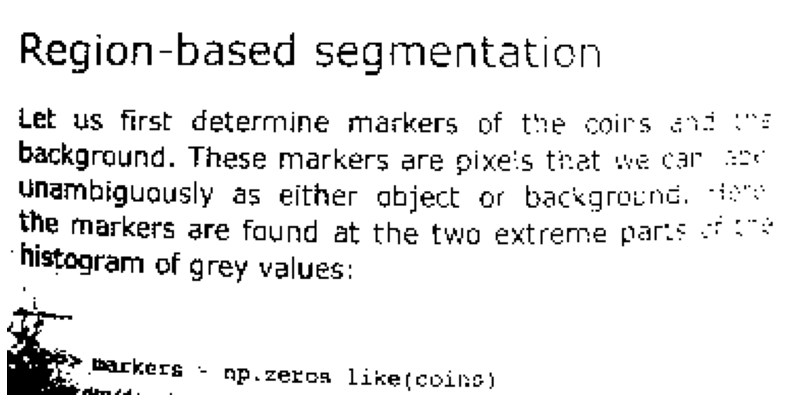

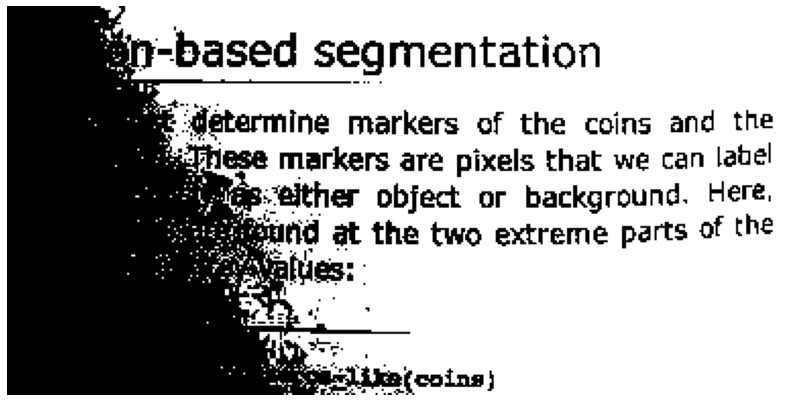

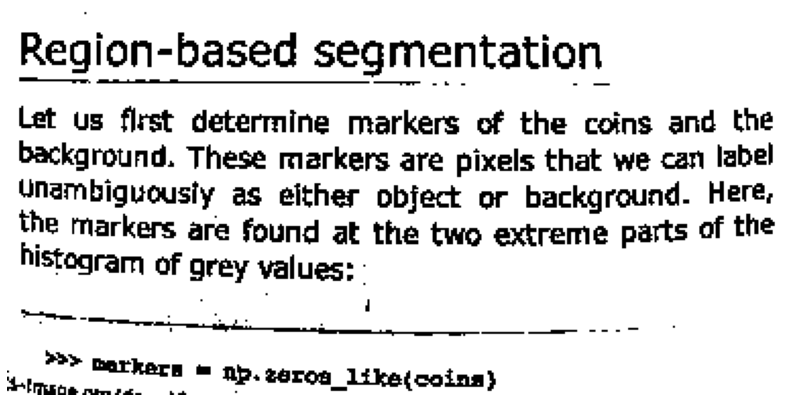

In [137]:
#Following along with demo:
text = data.page()
image_show(text)

#To decide a threshold, use histogram.
fig, ax = plt.subplots(1,1)
ax.hist(text.ravel(), bins=32, range=[0, 256]) #ravel returns a contiguous, 1D array 
ax.set_xlim(0, 256)

#Segmentation-- skimage has the <, >, overloaded for arrays! hooray 
text_segmented = text > 80
image_show(text_segmented)

#Other unsupervised methods that find a threshold for you-- moderate success.
text_threshold = filters.threshold_otsu(text)
image_show(text > text_threshold)

#Local is pretty good:
text_threshold = filters.threshold_local(text,block_size=51, offset=10) #for local thresholding, specify block size and offset
image_show(text > text_threshold)

#There are other supervised learning algos: Random Walkers, Active Contour.

(<Figure size 1008x1008 with 1 Axes>, <AxesSubplot:>)

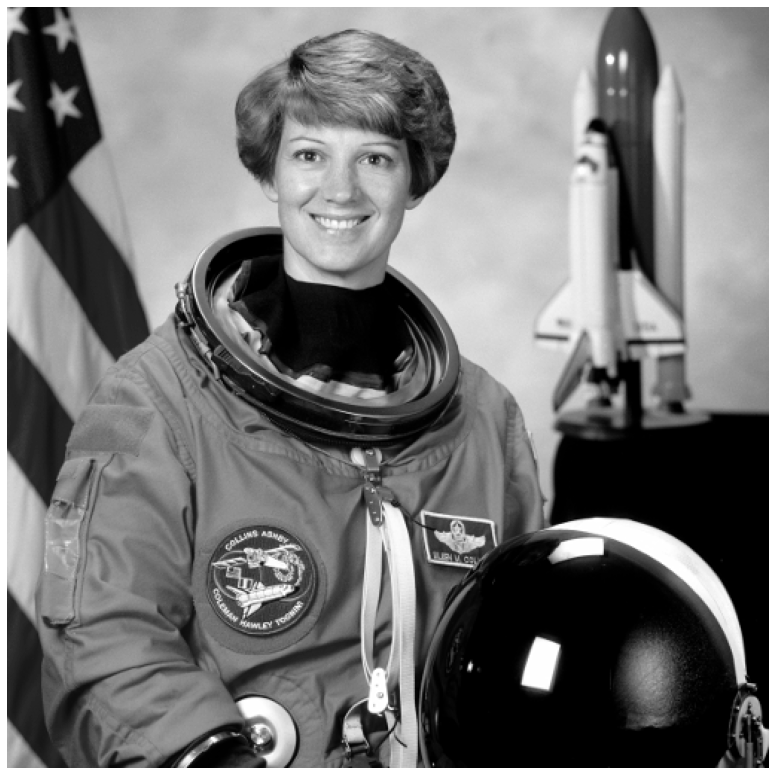

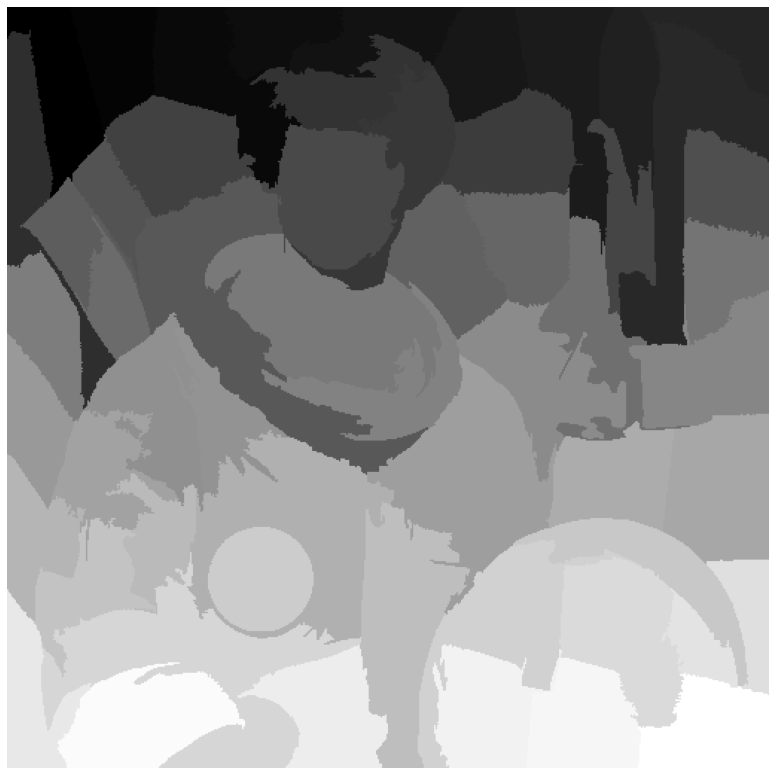

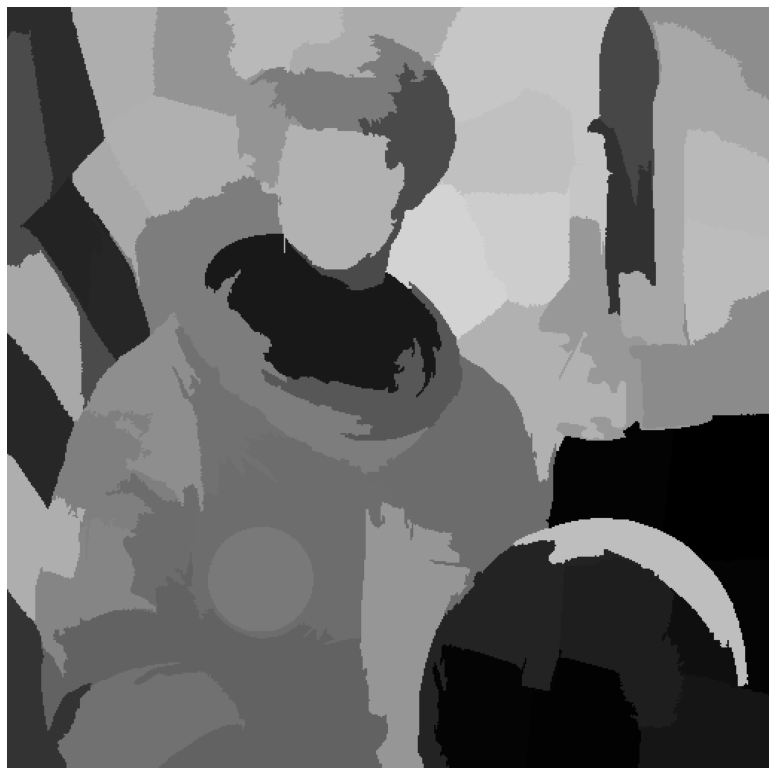

In [146]:
#Continuing Tutorial:
image = data.astronaut()
image_gray = color.rgb2gray(image)
image_show(image_gray)

image_slic = seg.slic(image, n_segments=100)    #Produce Partitions
image_show(image_slic)

image_show(color.label2rgb(image_slic, image_gray, kind='avg'))   #Color the labels according to original colors.

(<Figure size 1008x1008 with 1 Axes>, <AxesSubplot:>)

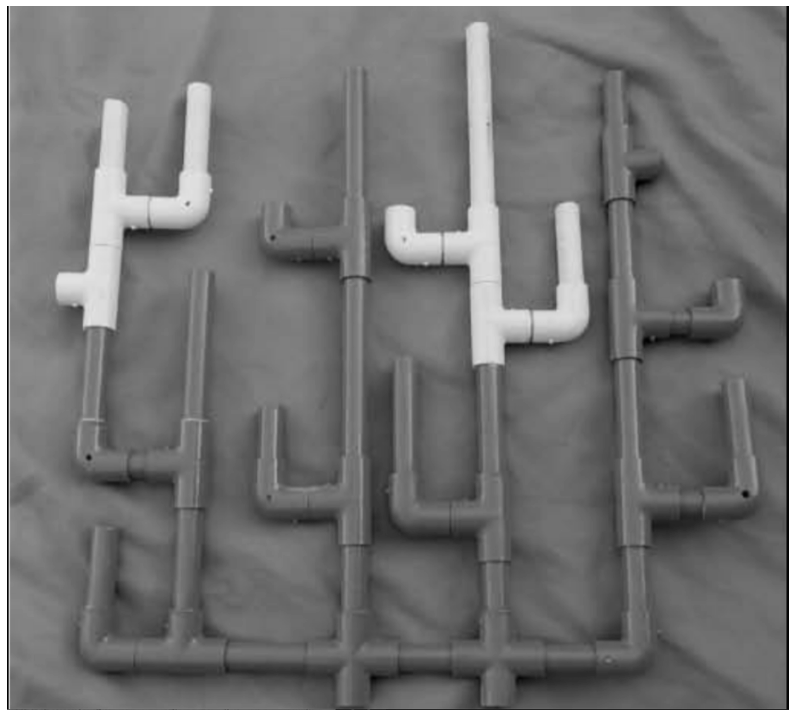

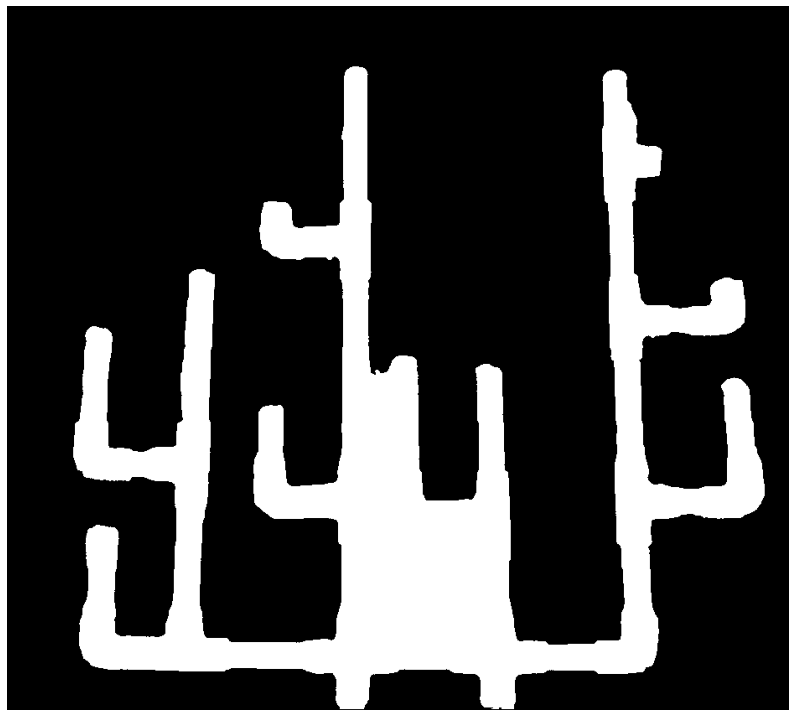

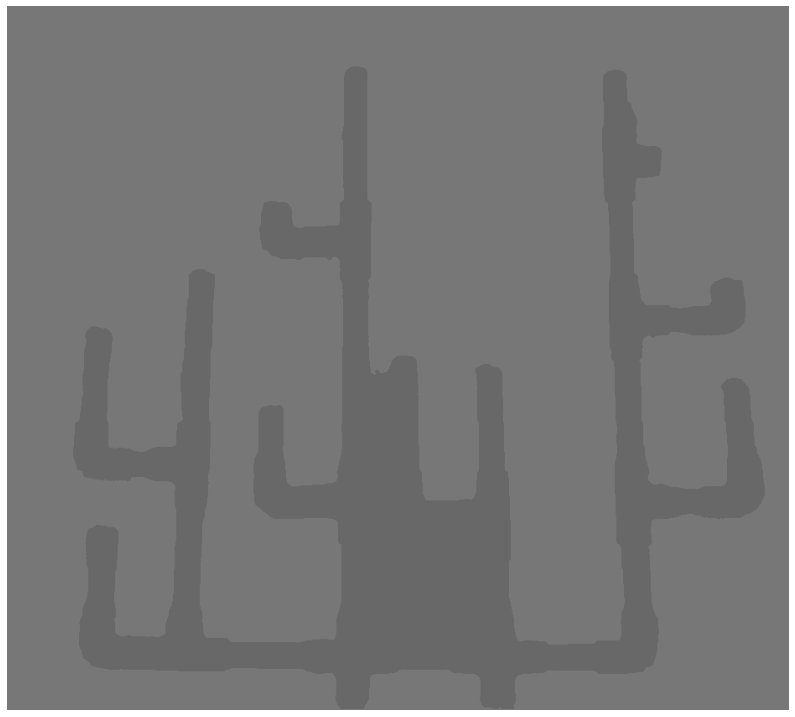

In [164]:
image = imgOld 
image_gray = color.rgb2gray(image)
image_show(image_gray)

image_slic = seg.slic(image, n_segments=3)    #Produce Partitions
image_show(image_slic)

image_show(color.label2rgb(image_slic, image_gray, kind='avg'))   #Color the labels according to original colors.

(<Figure size 1008x1008 with 1 Axes>, <AxesSubplot:>)

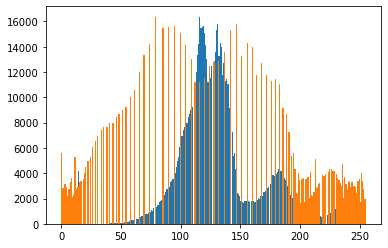

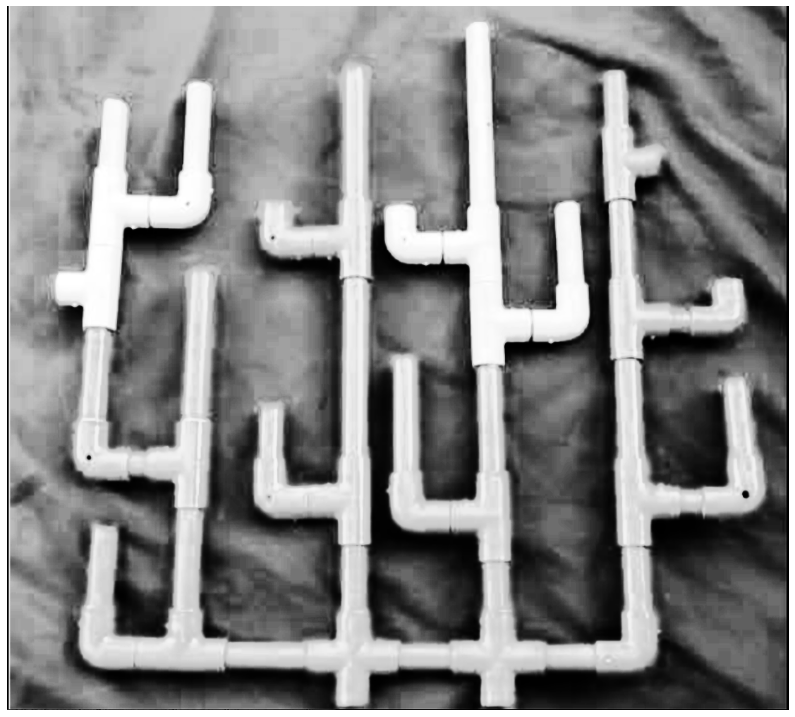

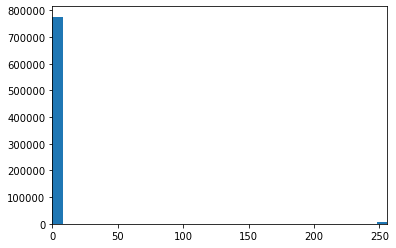

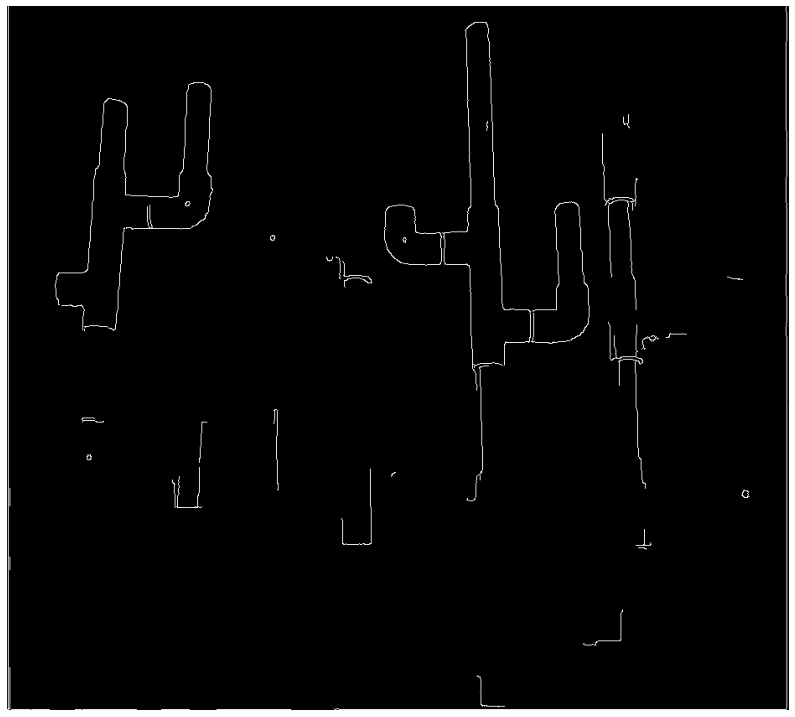

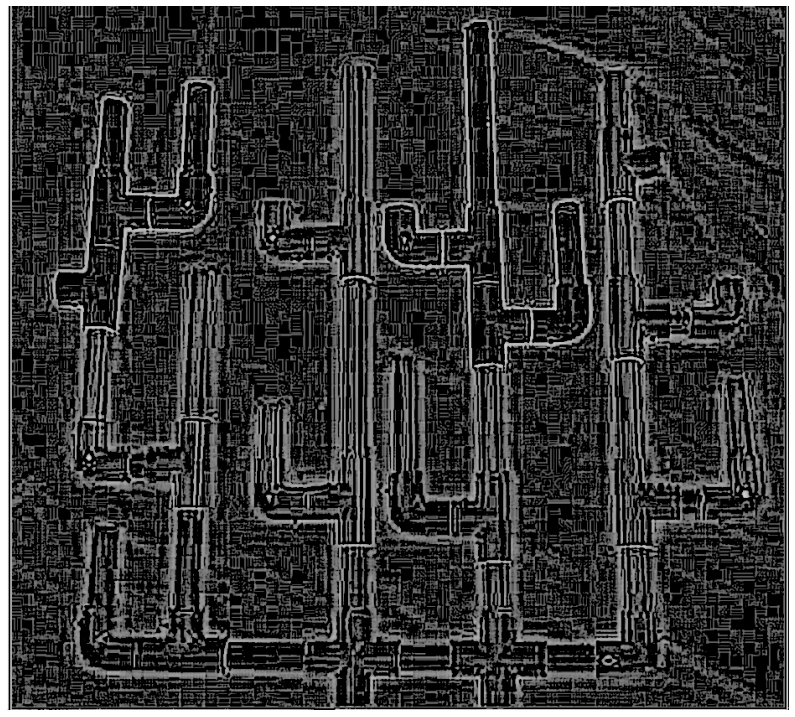

In [231]:
#Local processing Threshold
test1 = imgOld[:,:,0]
test2 = saturation
test3 = HSV_blur[:,:,1]
test4 = HSV_img[:,:,2]

img_threshold = filters.threshold_local(test3,block_size=51, offset=10) #for local thresholding, specify block size and offset
#image_show(test3 > img_threshold)
#Works okay.

#Canny Edge + FloodFill + Mask Subtraction -> Cleaner Kmeans?
#First, the laplacian:
lap = cv.Laplacian(test4,ddepth=2,ksize=5) #Can bearly see anything
# image_show(lap)

edges = cv.Canny(imgOld,100,200) #not getting tremendous contrast
# image_show(edges)

#Increasing contrast:
equ = cv2.equalizeHist(test4)
_ = plt.hist(test4.flatten(), bins=256)
_ = plt.hist(equ.flatten(), bins=256)

edges = cv.Canny(imgOld,100,200)
image_show(equ)

fig, ax = plt.subplots(1,1)
ax.hist(edges.ravel(), bins=32, range=[0, 256]) #ravel returns a contiguous, 1D array 
ax.set_xlim(0, 256)

image_show(edges)
image_show(np.log(1 + abs(lap)))


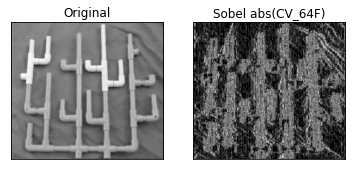

In [215]:
# Output dtype = cv2.CV_64F. Then take its absolute and convert to cv2.CV_8U
sobelx64f = cv2.Sobel(test4,cv2.CV_64F,1,0,ksize=5)
abs_sobel64f = np.absolute(sobelx64f)
sobel_8u = np.uint8(abs_sobel64f)

plt.subplot(1,2,1),plt.imshow(test4,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(1,2,2),plt.imshow(sobel_8u,cmap = 'gray')
plt.title('Sobel abs(CV_64F)'), plt.xticks([]), plt.yticks([])

plt.show()

#Image segmentation is hard!!!
Coral is spiky and these shadows make it difficult to judge edges.

[[191]
 [118]]


(<Figure size 1008x1008 with 1 Axes>, <AxesSubplot:>)

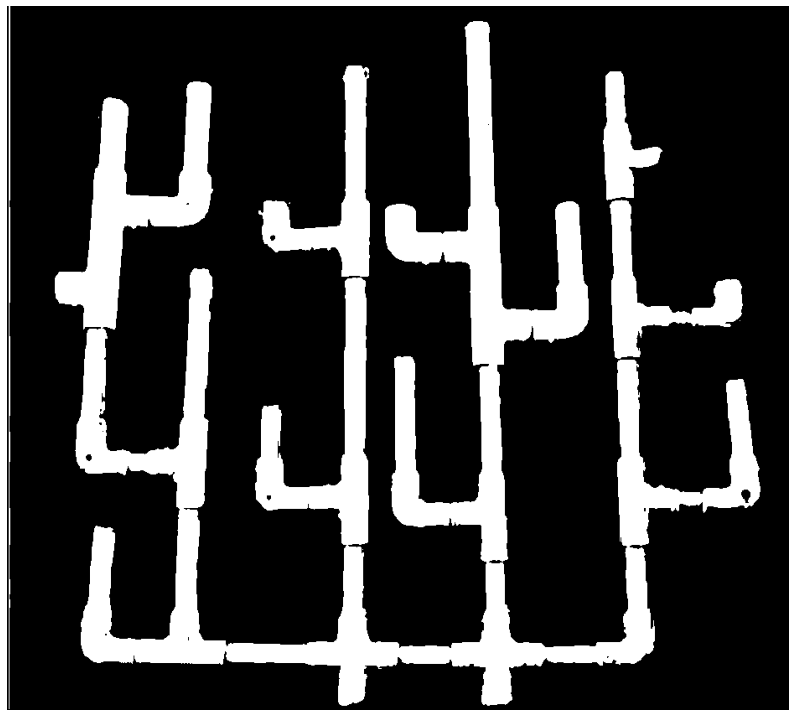

In [238]:
#If not, Kmeans does not work, starting to think I can do a two-stage binary segmentation. 
#Let me try increasing contrast then threholding/kmeans. Perhaps do not need this indirect watershed route. 

Z = HSV_img[:,:,2].flatten()
Z = np.float32(Z)
criteria = (cv.TERM_CRITERIA_EPS + cv.TermCriteria_MAX_ITER, 10, 1.0)
K = 2   #Quantize to three colors
ret, label, center = cv.kmeans(Z, K, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)

center = np.uint8(center)
print(center)
res = center[label.flatten()]
res2 = res.reshape((HSV_img[:,:,2].shape))

image_show(res2)

Background Threshold: 155
[[  0]
 [229]
 [179]]


(<Figure size 1008x1008 with 1 Axes>, <AxesSubplot:>)

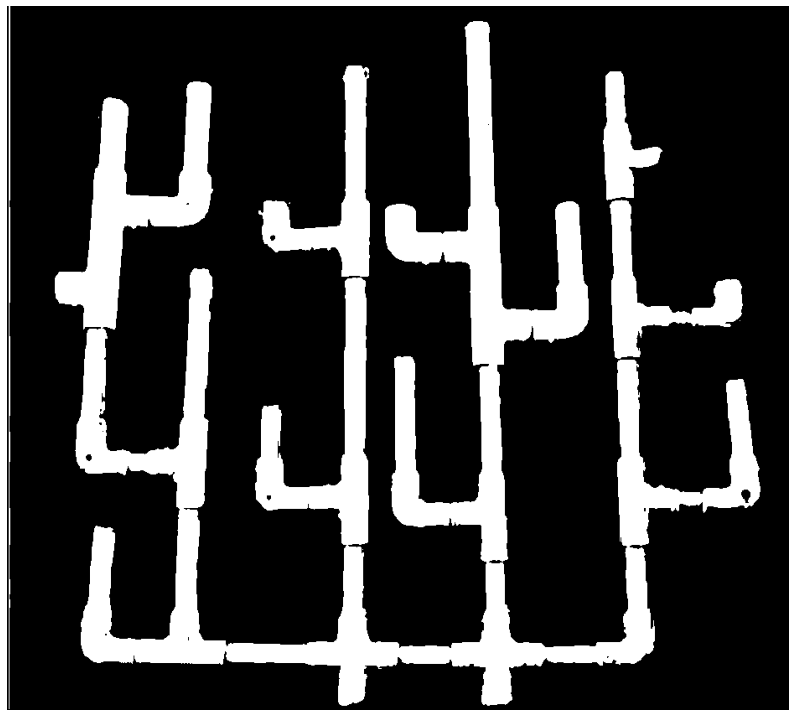

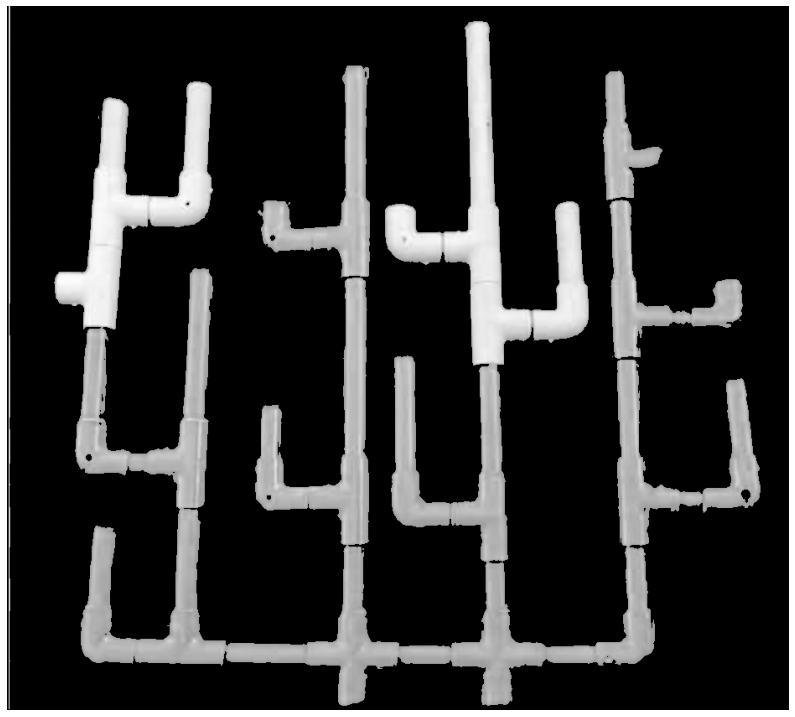

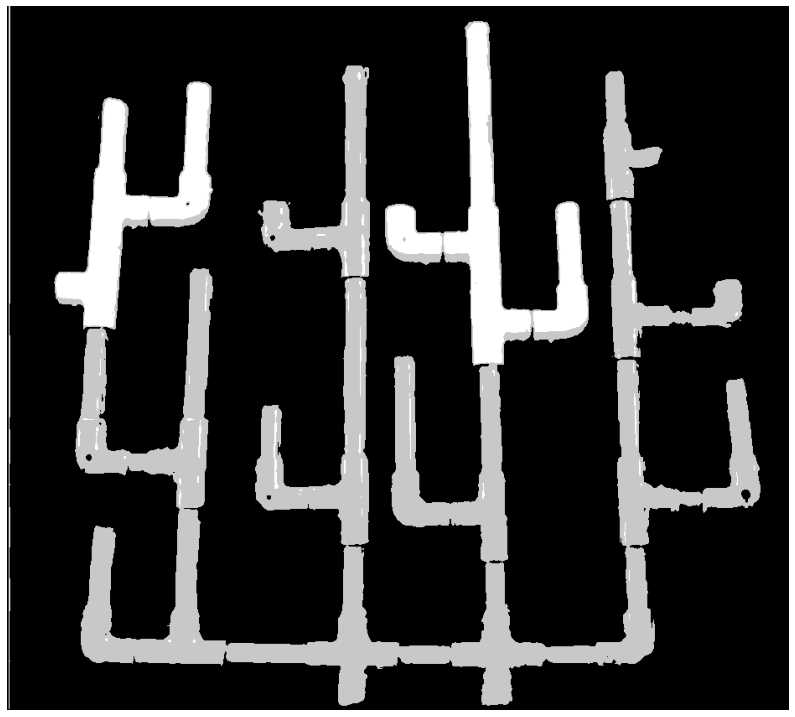

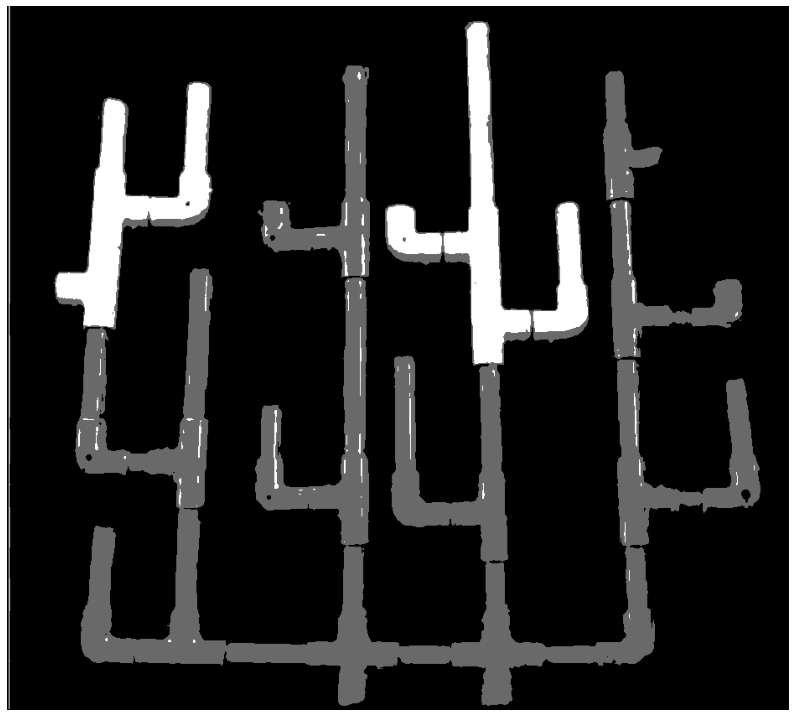

In [318]:
#Wowie, 2-category kmeans did the trick-- opencv's implementation 
#Now subtract the background and apply kmeans again with 3 categories!

coral = HSV_img[:,:,2]
background_threshold = filters.threshold_otsu(coral)
image_show(coral > background_threshold)
print("Background Threshold:", background_threshold)

#Set background to complete black and now kmeans:
coral2 = coral.copy()
coral2[coral2 < background_threshold] = 0   #just so happens coral is brighter than the background, should check with Peter is you are blacking the right thing.
image_show(coral2)

Z = coral2.flatten()
Z = np.float32(Z)
criteria = (cv.TERM_CRITERIA_EPS + cv.TermCriteria_MAX_ITER, 10, 1.0)
K = 3   #Quantize to three colors
ret, label, center = cv.kmeans(Z, K, None, criteria, 10, cv.KMEANS_RANDOM_CENTERS)

center = np.uint8(center)
print(center)
res = center[label.flatten()]
res2 = res.reshape((coral2.shape))

image_show(res2)

#Finally, map to nice colors:
c = np.sort(center.flatten())
res3 = res2.copy()

res3 = np.where(res3==c[0], 30, res3)
res3 = np.where(res3==c[1], 100, res3)
res3 = np.where(res3==c[2], 200, res3)

image_show(res3)

Would be good to revist this once again to review things you learned (or look into things more deeply)
I do not believe you need to know the inner workings of all these algorithms, but good to list/categorize them when you need.

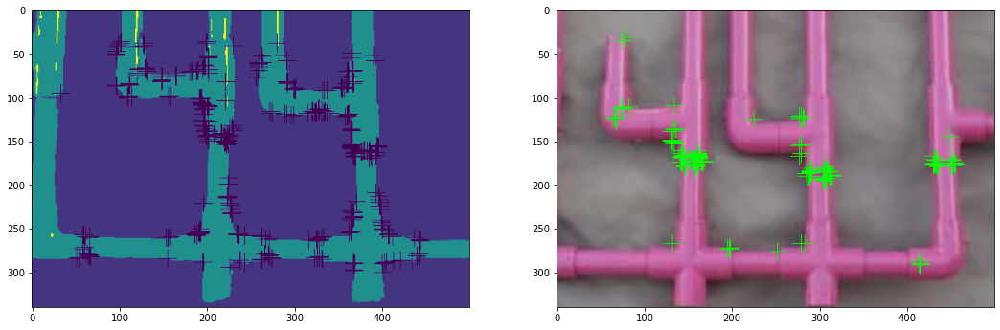

In [315]:
#Running ORB on segmented image:
imgCropped = imgOld[500:840, 200:700]

imgCropped = res3[500:840, 200:700]
testOrb = cv.ORB_create()

# find the keypoints with ORB
kp2, des2 = orb.detectAndCompute(imgCropped,None)

imgCropped2 = imgCropped.copy()
for marker in kp2:
	imgCropped2 = cv.drawMarker(imgCropped2, tuple(int(i) for i in marker.pt), color=(0, 255, 0))
#image_show(imgCropped2)

#Also try with other new image. If the features correspond, great. if they do not, tinker with ORB
newCropped = imgNew[500:840, 200:700]

kp3, des3 = orb.detectAndCompute(newCropped,None)

imgCropped3 = newCropped.copy()
for marker in kp3:
	imgCropped3 = cv.drawMarker(imgCropped3, tuple(int(i) for i in marker.pt), color=(0, 255, 0))
#image_show(imgCropped3)

#Side by side: 
fig, ax = plt.subplots(1, 2, figsize=(18,50))
ax[0].imshow(imgCropped2)

ax[1].imshow(imgCropped3)

#Selecting the best features:

#Applying the homography-- will it work??

Note to self:
    -Make some progress on this
    -Do the C setup-- do concurrently
    -Make C introduction video (which is graded :PP)

    -Do 442 Homework

    -Drop CSE 469-- you have the full class lectures. 